## 1. Importing Libraries

In [79]:
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## 2. Load Application Dataset

In [80]:
# Read application_data.csv
appdf = pd.read_csv('application_data.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
print(appdf.shape)
total_rows = appdf.shape[0]

(307511, 122)


## 3. Check the structure/metadata of the application data

In [81]:
print(appdf.info())
print(appdf.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None
SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID

## 4. Check for missing values and deal with them appropriately

###  a. Plot the column data w.r.t percentage

In [82]:
missingdata = pd.DataFrame((appdf.isnull().sum())*100/appdf.shape[0]).reset_index()
missingdata.head()
missingdata["type"] = "application_data"
fig = px.line(missingdata, x="index", y=0, color='type')
fig.update_layout(title='Percentage of Missing values in Application Data', width=2000,
                   xaxis_title='Columns',
                   yaxis_title='Percentages')

### b. Drop Columns with Missing values > 40%

In [83]:
drop_col=(appdf.isnull().sum())*100/appdf.shape[0]
drop_col=drop_col[drop_col.values>=40.0]
print('\n===> List of columns with more than 40% missing values:\n\n',drop_col)
print('\n===> Total Number of columns with missing values more than 40%: ',len(drop_col))
print('\n===> Shape of Application dataframe before dropping: ',appdf.shape)


===> List of columns with more than 40% missing values:

 OWN_CAR_AGE                     65.990810
EXT_SOURCE_1                    56.381073
APARTMENTS_AVG                  50.749729
BASEMENTAREA_AVG                58.515956
YEARS_BEGINEXPLUATATION_AVG     48.781019
YEARS_BUILD_AVG                 66.497784
COMMONAREA_AVG                  69.872297
ELEVATORS_AVG                   53.295980
ENTRANCES_AVG                   50.348768
FLOORSMAX_AVG                   49.760822
FLOORSMIN_AVG                   67.848630
LANDAREA_AVG                    59.376738
LIVINGAPARTMENTS_AVG            68.354953
LIVINGAREA_AVG                  50.193326
NONLIVINGAPARTMENTS_AVG         69.432963
NONLIVINGAREA_AVG               55.179164
APARTMENTS_MODE                 50.749729
BASEMENTAREA_MODE               58.515956
YEARS_BEGINEXPLUATATION_MODE    48.781019
YEARS_BUILD_MODE                66.497784
COMMONAREA_MODE                 69.872297
ELEVATORS_MODE                  53.295980
ENTRANCES_MODE   

In [84]:
### Drop all columns with more than 40% missing values
appdf.drop(labels=list(drop_col.index),axis=1,inplace=True)
### Check the shape of the dataframe after dropping
print('\n===> Shape of Application dataframe after dropping: ',appdf.shape)


===> Shape of Application dataframe after dropping:  (307511, 73)


### c. Handle columns with missing values < 40%

In [85]:
less_than_40_cols = (appdf.isnull().sum())
print(less_than_40_cols[less_than_40_cols > 0])

AMT_ANNUITY                      12
AMT_GOODS_PRICE                 278
NAME_TYPE_SUITE                1292
OCCUPATION_TYPE               96391
CNT_FAM_MEMBERS                   2
EXT_SOURCE_2                    660
EXT_SOURCE_3                  60965
OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
OBS_60_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
DAYS_LAST_PHONE_CHANGE            1
AMT_REQ_CREDIT_BUREAU_HOUR    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
dtype: int64


In [86]:
### Replace NaN values with median as there are many outliers                
appdf['AMT_ANNUITY'] = appdf['AMT_ANNUITY'].fillna(appdf['AMT_ANNUITY'].median())
print("Nan Values After replacement:", appdf["AMT_ANNUITY"].isnull().sum())

Nan Values After replacement: 0


In [87]:
## Replace NaN values with median as there are many outliers                
appdf['AMT_GOODS_PRICE'] = appdf['AMT_GOODS_PRICE'].fillna(appdf['AMT_GOODS_PRICE'].median())
print("Nan Values After replacement:", appdf["AMT_GOODS_PRICE"].isnull().sum())

Nan Values After replacement: 0


Nan Values before replacement: 1292


<AxesSubplot:>

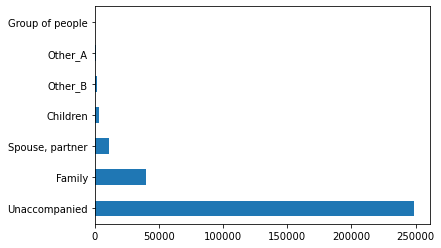

In [88]:
## NAME_TYPE_SUITE 1292 NaN values. Let's check for top category since it is a categorical column
print("Nan Values before replacement:", appdf["NAME_TYPE_SUITE"].isnull().sum())
appdf["NAME_TYPE_SUITE"].value_counts().plot(kind='barh')

In [89]:
# we can impute NaN values in "NAME_TYPE_SUITE" column with mode() values i.e., Unaccompanied using below code.
appdf['NAME_TYPE_SUITE'].fillna('Unaccompanied', inplace = True)
print("Nan Values After replacement:", appdf["NAME_TYPE_SUITE"].isnull().sum())

Nan Values After replacement: 0


In [90]:
#Checking value counts to know the count and percentage of maximum value in "OCCUPATION_TYPE" column
appdf['OCCUPATION_TYPE'].value_counts(normalize = True, dropna = False).mul(100).round(1)
## There are total 96391 missing values in "OCCUPATION_TYPE" which is approx. 31.3% of total values. This may be something that customer/client didn't disclose. 
## So, let's not impute these values and leave them as it couldbe MNAR (Missing Not a Random)

NaN                      31.3
Laborers                 17.9
Sales staff              10.4
Core staff                9.0
Managers                  6.9
Drivers                   6.0
High skill tech staff     3.7
Accountants               3.2
Medicine staff            2.8
Security staff            2.2
Cooking staff             1.9
Cleaning staff            1.5
Private service staff     0.9
Low-skill Laborers        0.7
Waiters/barmen staff      0.4
Secretaries               0.4
Realty agents             0.2
HR staff                  0.2
IT staff                  0.2
Name: OCCUPATION_TYPE, dtype: float64

In [91]:
## Let's replace NaN with "Mean" since there are not many clustered/densed outliers
appdf['CNT_FAM_MEMBERS'] = appdf['CNT_FAM_MEMBERS'].fillna(appdf['CNT_FAM_MEMBERS'].mean())
print("Nan Values After repleacement:", appdf["CNT_FAM_MEMBERS"].isnull().sum())

Nan Values After repleacement: 0


In [92]:
##EXT_SOURCE_2 and EXT_SOURCE_3 have 660 and 60965 NaN values. Let's drop these values as they don't provide meaningful info about the sources
appdf.drop(columns = ['EXT_SOURCE_2', 'EXT_SOURCE_3'], inplace = True)

In [93]:
## The data in "OBS_30_CNT_SOCIAL_CIRCLE", "DEF_30_CNT_SOCIAL_CIRCLE" , "OBS_60_CNT_SOCIAL_CIRCLE" & "DEF_60_CNT_SOCIAL_CIRCLE" columns is of clients social circle, which may not directly impact client's payment record. Therefore, we can drop these columns
appdf.drop(columns = ["OBS_30_CNT_SOCIAL_CIRCLE", "DEF_30_CNT_SOCIAL_CIRCLE" , "OBS_60_CNT_SOCIAL_CIRCLE" , "DEF_60_CNT_SOCIAL_CIRCLE"], inplace = True)

In [94]:
## Credit scores may be usually checked once in a while (hour/daily/weekly/monthly,quarterly/yearly). Let's replace these NaN values with median of the score.
print("Nan Values of AMT_REQ_CREDIT_BUREAU_HOUR before replacement:", appdf["AMT_REQ_CREDIT_BUREAU_HOUR"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_DAY before replacement:", appdf["AMT_REQ_CREDIT_BUREAU_DAY"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_WEEK before replacement:", appdf["AMT_REQ_CREDIT_BUREAU_WEEK"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_MON before replacement:", appdf["AMT_REQ_CREDIT_BUREAU_MON"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_QRT before replacement:", appdf["AMT_REQ_CREDIT_BUREAU_QRT"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_YEAR before replacement:", appdf["AMT_REQ_CREDIT_BUREAU_YEAR"].isnull().sum())

appdf['AMT_REQ_CREDIT_BUREAU_HOUR'] = appdf['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(appdf['AMT_REQ_CREDIT_BUREAU_HOUR'].median())
appdf['AMT_REQ_CREDIT_BUREAU_DAY'] = appdf['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(appdf['AMT_REQ_CREDIT_BUREAU_DAY'].median())
appdf['AMT_REQ_CREDIT_BUREAU_WEEK'] = appdf['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(appdf['AMT_REQ_CREDIT_BUREAU_WEEK'].median())
appdf['AMT_REQ_CREDIT_BUREAU_MON'] = appdf['AMT_REQ_CREDIT_BUREAU_MON'].fillna(appdf['AMT_REQ_CREDIT_BUREAU_MON'].median())
appdf['AMT_REQ_CREDIT_BUREAU_QRT'] = appdf['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(appdf['AMT_REQ_CREDIT_BUREAU_QRT'].median())
appdf['AMT_REQ_CREDIT_BUREAU_YEAR'] = appdf['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(appdf['AMT_REQ_CREDIT_BUREAU_YEAR'].median())
print('\n')
print("Nan Values of AMT_REQ_CREDIT_BUREAU_HOUR after replacement:", appdf["AMT_REQ_CREDIT_BUREAU_HOUR"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_DAY after replacement:", appdf["AMT_REQ_CREDIT_BUREAU_DAY"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_WEEK after replacement:", appdf["AMT_REQ_CREDIT_BUREAU_WEEK"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_MON after replacement:", appdf["AMT_REQ_CREDIT_BUREAU_MON"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_QRT after replacement:", appdf["AMT_REQ_CREDIT_BUREAU_QRT"].isnull().sum())
print("Nan Values of AMT_REQ_CREDIT_BUREAU_YEAR after replacement:", appdf["AMT_REQ_CREDIT_BUREAU_YEAR"].isnull().sum())

Nan Values of AMT_REQ_CREDIT_BUREAU_HOUR before replacement: 41519
Nan Values of AMT_REQ_CREDIT_BUREAU_DAY before replacement: 41519
Nan Values of AMT_REQ_CREDIT_BUREAU_WEEK before replacement: 41519
Nan Values of AMT_REQ_CREDIT_BUREAU_MON before replacement: 41519
Nan Values of AMT_REQ_CREDIT_BUREAU_QRT before replacement: 41519
Nan Values of AMT_REQ_CREDIT_BUREAU_YEAR before replacement: 41519


Nan Values of AMT_REQ_CREDIT_BUREAU_HOUR after replacement: 0
Nan Values of AMT_REQ_CREDIT_BUREAU_DAY after replacement: 0
Nan Values of AMT_REQ_CREDIT_BUREAU_WEEK after replacement: 0
Nan Values of AMT_REQ_CREDIT_BUREAU_MON after replacement: 0
Nan Values of AMT_REQ_CREDIT_BUREAU_QRT after replacement: 0
Nan Values of AMT_REQ_CREDIT_BUREAU_YEAR after replacement: 0


In [95]:
# The number of days is mentioned as negative. Need to make them into absolute values and to years by diving the days.
appdf[["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH"]] = appdf[["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH"]].abs()

# Coverting days to years
appdf[["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH"]] = round(appdf[["DAYS_BIRTH","DAYS_EMPLOYED","DAYS_REGISTRATION","DAYS_ID_PUBLISH"]]/365, 1)
# changing "DAYS_LAST_PHONE_CHANGE" to absolute values from negative values (if any) and converting to years
appdf["DAYS_LAST_PHONE_CHANGE"] = round(abs(appdf["DAYS_LAST_PHONE_CHANGE"]/365), 1)
# Rename the columns names "DAYS" to "YEARS" 
appdf.rename(columns = {"DAYS_BIRTH":"YEARS_BIRTH", "DAYS_EMPLOYED":"YEARS_EMPLOYED", "DAYS_REGISTRATION": "YEARS_REGISTRATION", "DAYS_ID_PUBLISH":"YEARS_ID_PUBLISH"}, inplace = True)
appdf.rename(columns = {"DAYS_LAST_PHONE_CHANGE":"YEARS_LAST_PHONE_CHANGE"}, inplace = True)
appdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 67 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

### Binning of data

In [96]:
# Creating bins based on age 
appdf['AGE_GROUP'] = pd.cut(appdf.YEARS_BIRTH, bins = [0, 18, 28, 35, 45, 50, 60, 75])
appdf.AGE_GROUP.value_counts()

(35, 45]    84088
(50, 60]    68067
(28, 35]    55098
(45, 50]    35276
(60, 75]    35236
(18, 28]    29746
(0, 18]         0
Name: AGE_GROUP, dtype: int64

In [97]:
# Creating bins based on income
appdf['INCOME_GROUP'] = pd.cut(appdf.AMT_INCOME_TOTAL, bins = [0, 250000, 500000, 1500000, 3000000, 4500000, 7500000], labels = ['Very Low Income(<2.5L)', 'Low Income(2.5-5L)', 'Medium Income(5-15L)', 'Good Income(15-30L)', 'High Income(30-45L)', 'Very High Income(>75L)']) 
appdf['INCOME_GROUP'].value_counts()

Very Low Income(<2.5L)    267733
Low Income(2.5-5L)         37076
Medium Income(5-15L)        2618
Good Income(15-30L)           67
High Income(30-45L)           12
Very High Income(>75L)         1
Name: INCOME_GROUP, dtype: int64

### Target Variable analysis    

In [98]:
appdf.TARGET.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [99]:
# Let's divide the data based on target variable (defaulters vs non-defaulters)
non_defaulter = appdf[appdf['TARGET'] == 0]
defaulter = appdf[appdf['TARGET'] == 1]

### Categorising columns

In [100]:
# User Pandas built-in function to get numeric data
numeric_data = appdf.drop(['SK_ID_CURR','TARGET'],axis=1)
numeric_data = list(numeric_data._get_numeric_data().columns)
print('Numerical Data Columns:\n\n',numeric_data)

print('\n')

categorical_data = list(set(appdf.columns) - set(appdf._get_numeric_data().columns))
print('Categorical Data Columns:\n\n',categorical_data)


Numerical Data Columns:

 ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'YEARS_BIRTH', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'YEARS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_

## Univariate Analysis 

### Catagorical

### Target Variable : Gender

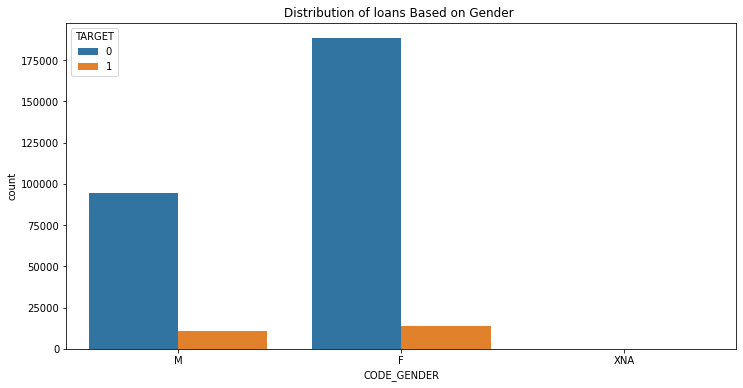

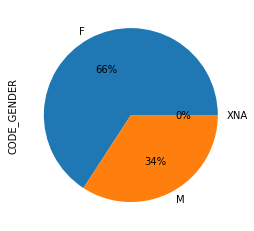

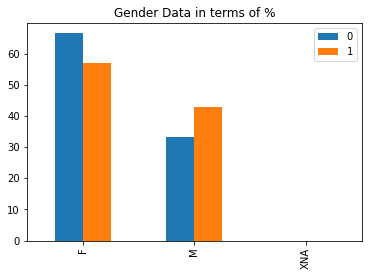

In [101]:
## Let's figure out the distribution of defaulters vs Non-defaulters based on Gender
plt.figure(figsize = [12,6])
plt.title("Distribution of loans Based on Gender ")
sns.countplot(appdf.CODE_GENDER, hue=appdf.TARGET)
plt.show()

appdf['CODE_GENDER'].value_counts().plot.pie(autopct="%1.0f%%")
plt.show()

genderdf = pd.DataFrame()
genderdf['0'] = (appdf.loc[appdf['TARGET']==0]['CODE_GENDER'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
genderdf['1'] = (appdf.loc[appdf['TARGET']==1]['CODE_GENDER'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
genderdf.plot.bar()
plt.title('Gender Data in terms of %')
plt.show()

### Target Variable : Name Contract Type

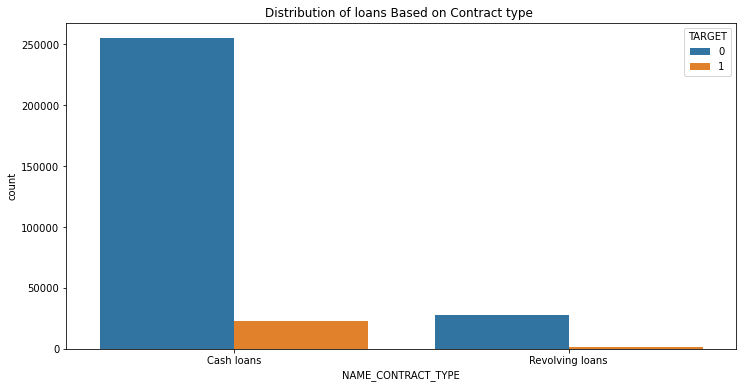

In [102]:
plt.figure(figsize = [12,6])
plt.title("Distribution of loans Based on Contract type ")
sns.countplot(appdf.NAME_CONTRACT_TYPE, hue=appdf.TARGET)
plt.show()

### Target Variable : Age Group

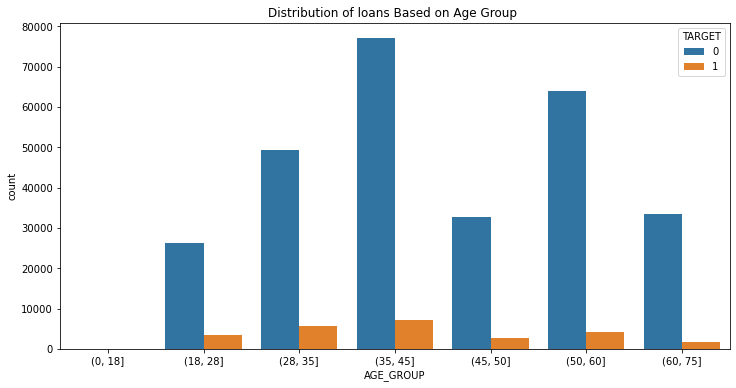

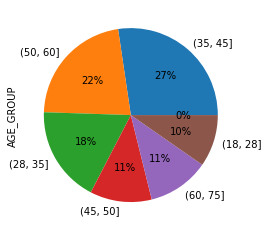

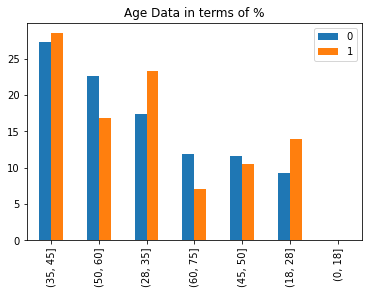

In [103]:
plt.figure(figsize = [12,6])
plt.title("Distribution of loans Based on Age Group ")
sns.countplot(appdf.AGE_GROUP, hue=appdf.TARGET)
plt.show()

appdf['AGE_GROUP'].value_counts().plot.pie(autopct="%1.0f%%")
plt.show()

agedf = pd.DataFrame()
agedf['0'] = (appdf.loc[appdf['TARGET']==0]['AGE_GROUP'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
agedf['1'] = (appdf.loc[appdf['TARGET']==1]['AGE_GROUP'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
agedf.plot.bar()
plt.title('Age Data in terms of %')
plt.show()

### Target Variable : Income Group

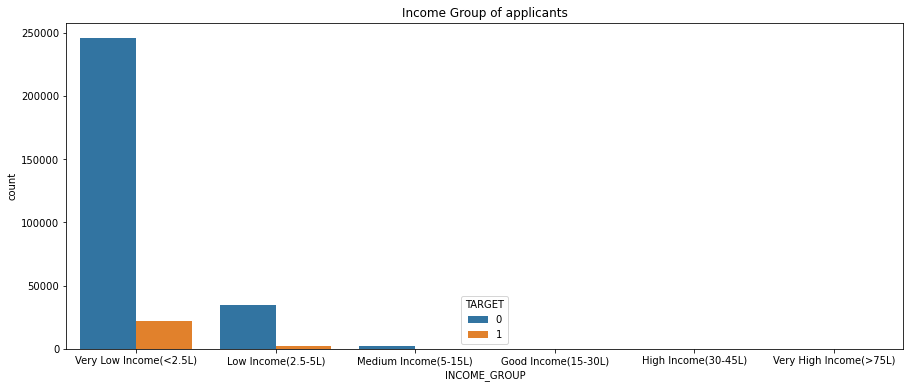

In [104]:
plt.figure(figsize = [15,6])

plt.title("Income Group of applicants")
sns.countplot(appdf.INCOME_GROUP, hue=appdf.TARGET)
plt.show()

### Target Variable : Name Income Type

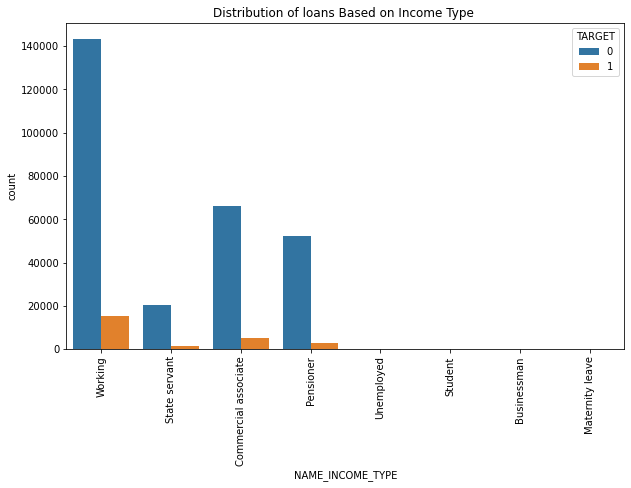

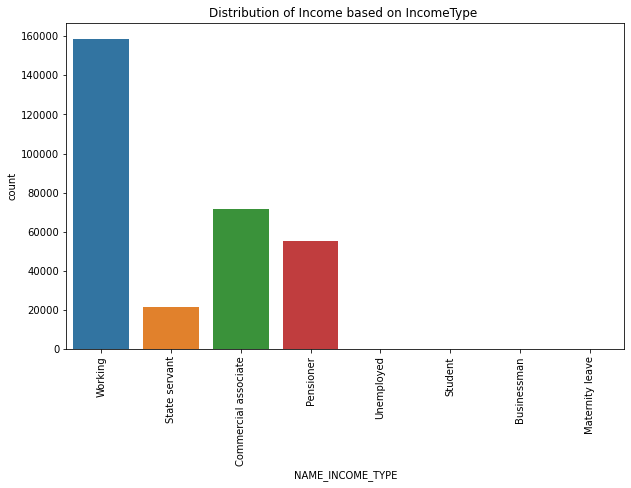

In [105]:
plt.figure(figsize = [10,6])
plt.title("Distribution of loans Based on Income Type ")
sns.countplot(appdf.NAME_INCOME_TYPE, hue=appdf.TARGET)
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize = [10,6])
plt.title("Distribution of Income based on IncomeType ")
sns.countplot(appdf.NAME_INCOME_TYPE)
plt.xticks(rotation=90)
plt.show()

### Target Variable : Name Contract Type

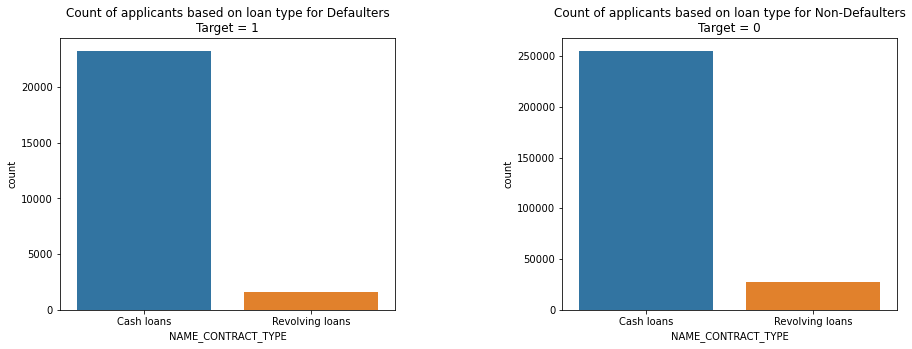

In [106]:
plt.figure(figsize = [15,5])
plt.subplot(1,2,1)
plt.title("Count of applicants based on loan type for Defaulters\nTarget = 1")
sns.countplot(defaulter.NAME_CONTRACT_TYPE)

plt.subplots_adjust(wspace = 0.5)
plt.subplot(1,2,2)
plt.title("Count of applicants based on loan type for Non-Defaulters\nTarget = 0")
sns.countplot(non_defaulter.NAME_CONTRACT_TYPE)
plt.show()

### Target Variable : Family Status

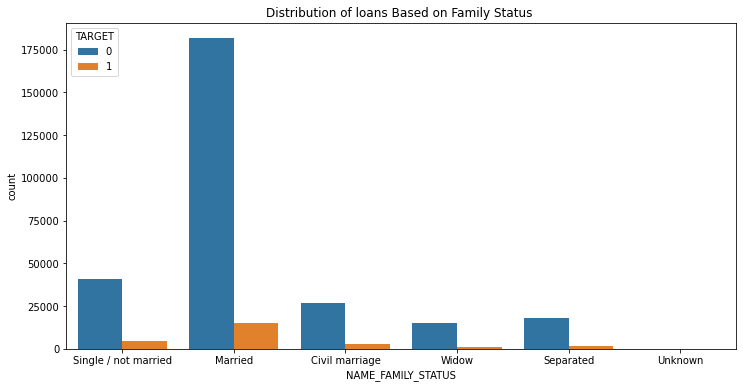

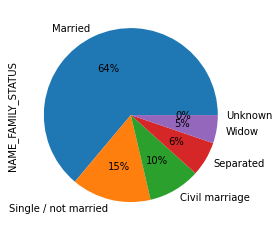

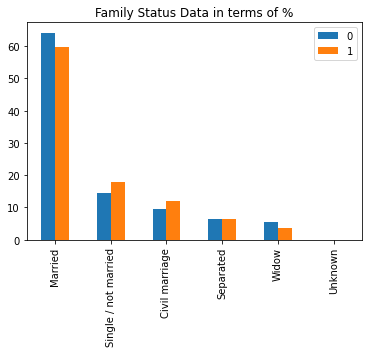

In [107]:
plt.figure(figsize = [12,6])
plt.title("Distribution of loans Based on Family Status ")
sns.countplot(appdf.NAME_FAMILY_STATUS, hue=appdf.TARGET)
plt.show()

appdf['NAME_FAMILY_STATUS'].value_counts().plot.pie(autopct="%1.0f%%")
plt.show()

genderdf = pd.DataFrame()
genderdf['0'] = (appdf.loc[appdf['TARGET']==0]['NAME_FAMILY_STATUS'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
genderdf['1'] = (appdf.loc[appdf['TARGET']==1]['NAME_FAMILY_STATUS'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
genderdf.plot.bar()
plt.title('Family Status Data in terms of %')
plt.show()

### Target Variable : Name Education Type

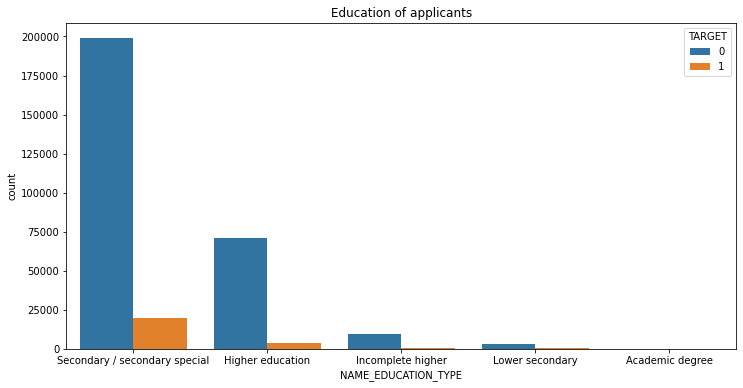

In [108]:
plt.figure(figsize = [12,6])

plt.title("Education of applicants")
sns.countplot(appdf.NAME_EDUCATION_TYPE, hue=appdf.TARGET)
plt.show()

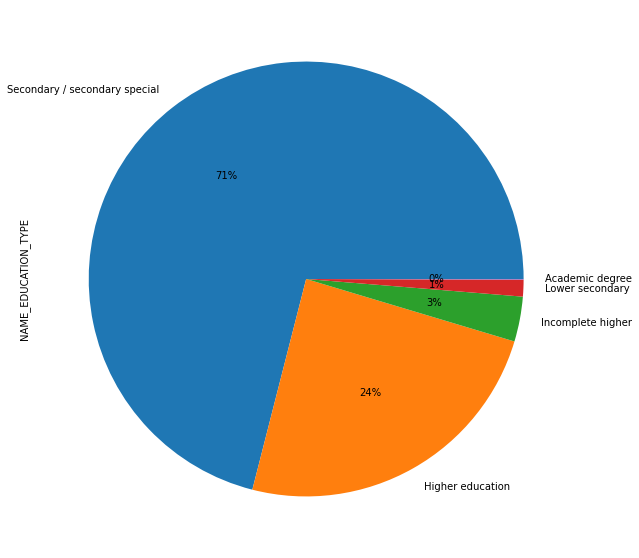

<Figure size 864x720 with 0 Axes>

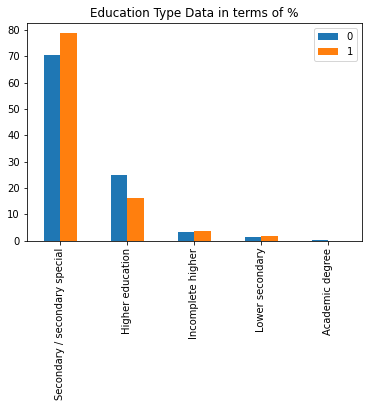

In [109]:
plt.figure(figsize=(12,10))
appdf["NAME_EDUCATION_TYPE"].value_counts().plot.pie(autopct = "%1.0f%%")
plt.show()

edudf = pd.DataFrame()
plt.figure(figsize=(12,10))
edudf['0'] = (appdf.loc[appdf['TARGET']==0]['NAME_EDUCATION_TYPE'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
edudf['1'] = (appdf.loc[appdf['TARGET']==1]['NAME_EDUCATION_TYPE'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
edudf.plot.bar()
plt.title('Education Type Data in terms of %')
plt.show()

### Target Variable : Flag Own Car

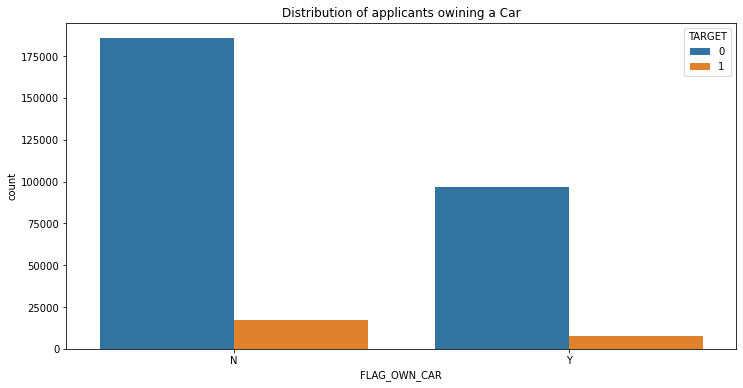

<Figure size 864x720 with 0 Axes>

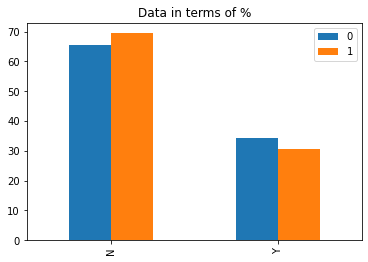

In [110]:
plt.figure(figsize = [12,6])

plt.title("Distribution of applicants owining a Car")
sns.countplot(appdf.FLAG_OWN_CAR, hue=appdf.TARGET)
plt.show()

htypedf = pd.DataFrame()
plt.figure(figsize=(12,10))
htypedf['0'] = (appdf.loc[appdf['TARGET']==0]['FLAG_OWN_CAR'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
htypedf['1'] = (appdf.loc[appdf['TARGET']==1]['FLAG_OWN_CAR'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
htypedf.plot.bar()
plt.title('Data in terms of %')
plt.show()

### Target Variable : Flag Own Realty

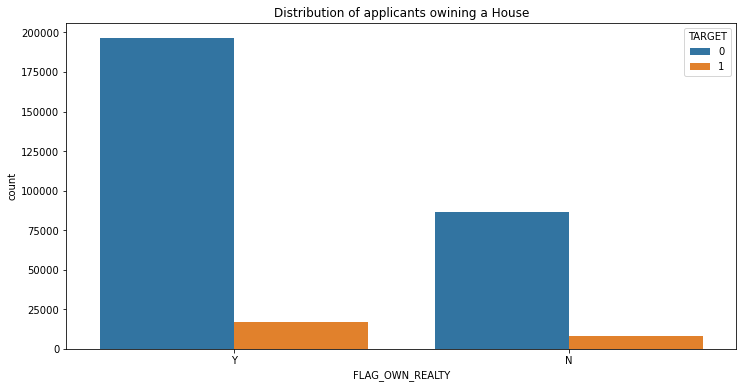

<Figure size 864x720 with 0 Axes>

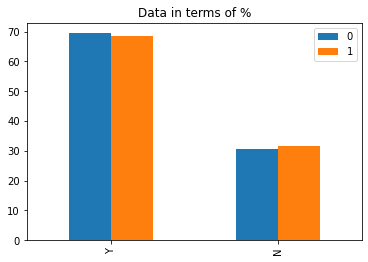

In [111]:
plt.figure(figsize = [12,6])

plt.title("Distribution of applicants owining a House")
sns.countplot(appdf.FLAG_OWN_REALTY, hue=appdf.TARGET)
plt.show()

htypedf = pd.DataFrame()
plt.figure(figsize=(12,10))
htypedf['0'] = (appdf.loc[appdf['TARGET']==0]['FLAG_OWN_REALTY'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
htypedf['1'] = (appdf.loc[appdf['TARGET']==1]['FLAG_OWN_REALTY'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
htypedf.plot.bar()
plt.title('Data in terms of %')
plt.show()

### Target Variable : Name Housing Type

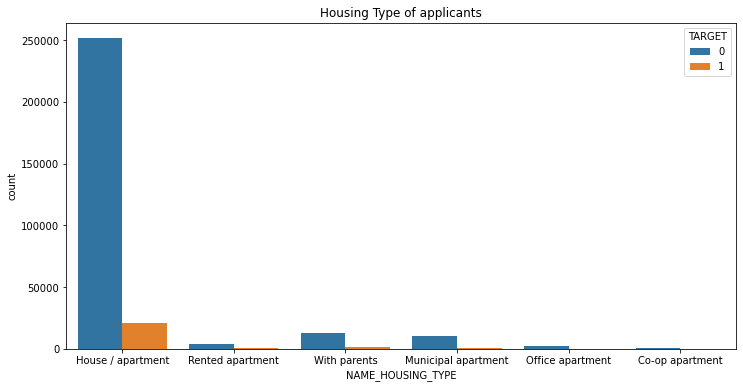

<Figure size 864x720 with 0 Axes>

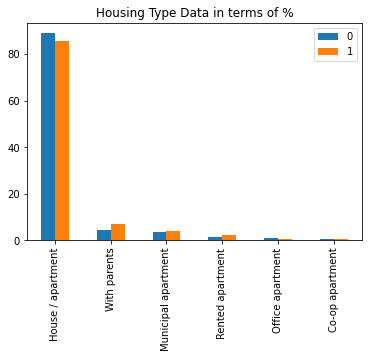

In [112]:
plt.figure(figsize = [12,6])

plt.title("Housing Type of applicants")
sns.countplot(appdf.NAME_HOUSING_TYPE, hue=appdf.TARGET)
plt.show()

htypedf = pd.DataFrame()
plt.figure(figsize=(12,10))
htypedf['0'] = (appdf.loc[appdf['TARGET']==0]['NAME_HOUSING_TYPE'].value_counts()/len(appdf.loc[appdf['TARGET']==0])) * 100
htypedf['1'] = (appdf.loc[appdf['TARGET']==1]['NAME_HOUSING_TYPE'].value_counts()/len(appdf.loc[appdf['TARGET']==1])) * 100
htypedf.plot.bar()
plt.title('Housing Type Data in terms of %')
plt.show()

### 

### Numerical

### Target Variable : Amount Income Total

In [113]:
## Get the data from defaulters and non-defaulters
print('Defaulters:\n\n',defaulter.AMT_INCOME_TOTAL.describe().apply(lambda x: format(x, 'f')))
print('\n')
print('Non-Defaulters:\n\n',non_defaulter.AMT_INCOME_TOTAL.describe().apply(lambda x: format(x, 'f')))

Defaulters:

 count        24825.000000
mean        165611.760906
std         746676.959440
min          25650.000000
25%         112500.000000
50%         135000.000000
75%         202500.000000
max      117000000.000000
Name: AMT_INCOME_TOTAL, dtype: object


Non-Defaulters:

 count      282686.000000
mean       169077.722266
std        110476.268524
min         25650.000000
25%        112500.000000
50%        148500.000000
75%        202500.000000
max      18000090.000000
Name: AMT_INCOME_TOTAL, dtype: object


### Target Variable : Amount Credit

In [114]:
## Get the data from defaulters and non-defaulters
print('Defaulters:\n\n',defaulter.AMT_CREDIT.describe().apply(lambda x: format(x, 'f')))
print('\n')
print('Non-Defaulters:\n\n',non_defaulter.AMT_CREDIT.describe().apply(lambda x: format(x, 'f')))

Defaulters:

 count      24825.000000
mean      557778.527674
std       346433.235646
min        45000.000000
25%       284400.000000
50%       497520.000000
75%       733315.500000
max      4027680.000000
Name: AMT_CREDIT, dtype: object


Non-Defaulters:

 count     282686.000000
mean      602648.282002
std       406845.907710
min        45000.000000
25%       270000.000000
50%       517788.000000
75%       810000.000000
max      4050000.000000
Name: AMT_CREDIT, dtype: object


### Target Variable : Amount Annuity

In [115]:
## Get the data from defaulters and non-defaulters
print('Defaulters:\n\n',defaulter.AMT_ANNUITY.describe().apply(lambda x: format(x, 'f')))
print('\n')
print('Non-Defaulters:\n\n',non_defaulter.AMT_ANNUITY.describe().apply(lambda x: format(x, 'f')))

Defaulters:

 count     24825.000000
mean      26481.744290
std       12450.676999
min        2722.500000
25%       17361.000000
50%       25263.000000
75%       32976.000000
max      149211.000000
Name: AMT_ANNUITY, dtype: object


Non-Defaulters:

 count    282686.000000
mean      27163.527386
std       14658.003451
min        1615.500000
25%       16456.500000
50%       24876.000000
75%       34749.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: object


### Target Variable : Amount Goods Price

In [116]:
## Get the data from defaulters and non-defaulters
print('Defaulters:\n\n',defaulter.AMT_GOODS_PRICE.describe().apply(lambda x: format(x, 'f')))
print('\n')
print('Non-Defaulters:\n\n',non_defaulter.AMT_GOODS_PRICE.describe().apply(lambda x: format(x, 'f')))

Defaulters:

 count      24825.000000
mean      488939.444955
std       311506.712723
min        45000.000000
25%       238500.000000
50%       450000.000000
75%       675000.000000
max      3600000.000000
Name: AMT_GOODS_PRICE, dtype: object


Non-Defaulters:

 count     282686.000000
mean      542652.484651
std       373625.997289
min        40500.000000
25%       238500.000000
50%       450000.000000
75%       685002.375000
max      4050000.000000
Name: AMT_GOODS_PRICE, dtype: object


### Target Variable : Number of Children

In [117]:
## Get the data from defaulters and non-defaulters
print('Defaulters:\n\n',defaulter.CNT_CHILDREN.describe())
print('\n')
print('Non-Defaulters:\n\n',non_defaulter.CNT_CHILDREN.describe())

Defaulters:

 count    24825.000000
mean         0.463807
std          0.756903
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         11.000000
Name: CNT_CHILDREN, dtype: float64


Non-Defaulters:

 count    282686.000000
mean          0.412946
std           0.718843
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64


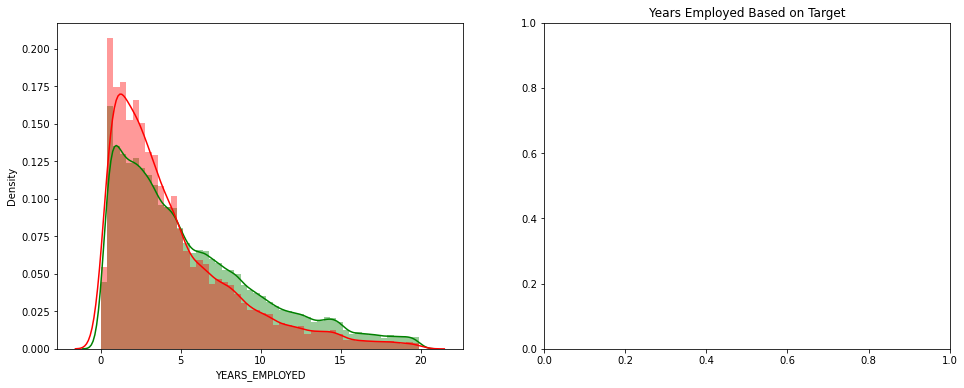

In [118]:
tmp = appdf[appdf["YEARS_EMPLOYED"] < 20]

fig, ax = plt.subplots(1,2, figsize=(16,6))
plt.title('Years Employed Based on Target')
sns.distplot(tmp[tmp["TARGET"]==0]["YEARS_EMPLOYED"],color="g", ax = ax[0])
sns.distplot(tmp[tmp["TARGET"]==1]["YEARS_EMPLOYED"],color="r", ax = ax[0])
plt.show()

### Target Variable : Total Population

In [119]:
## Get the data from defaulters and non-defaulters
print('Defaulters:\n\n',defaulter.REGION_POPULATION_RELATIVE.describe())
print('\n')
print('Non-Defaulters:\n\n',non_defaulter.REGION_POPULATION_RELATIVE.describe())

Defaulters:

 count    24825.000000
mean         0.019131
std          0.011905
min          0.000533
25%          0.009630
50%          0.018634
75%          0.025164
max          0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64


Non-Defaulters:

 count    282686.000000
mean          0.021021
std           0.013978
min           0.000290
25%           0.010006
50%           0.018850
75%           0.028663
max           0.072508
Name: REGION_POPULATION_RELATIVE, dtype: float64


## Bivariate Analysis

### Numerical - Numerical

In [120]:
# Creating dataframes with only useful numeric columns to find correlation 
num_defaulter = defaulter[["AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "YEARS_BIRTH", "YEARS_EMPLOYED", "YEARS_LAST_PHONE_CHANGE", "REGION_POPULATION_RELATIVE"]]
num_non_defaulter = non_defaulter[["AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "YEARS_BIRTH", "YEARS_EMPLOYED", "YEARS_LAST_PHONE_CHANGE", "REGION_POPULATION_RELATIVE"]]

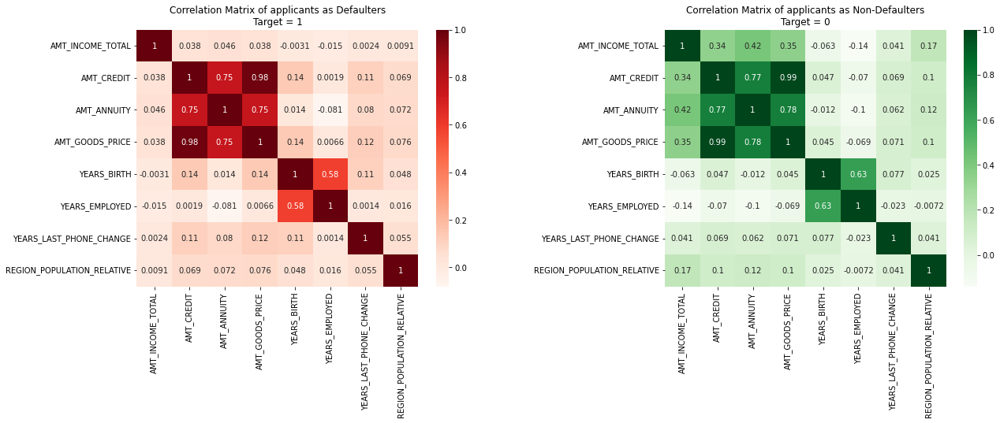

In [121]:
## Create a heatmap for correlation
plt.figure(figsize = [20, 6])

plt.subplot(1,2,1)
plt.title("Correlation Matrix of applicants as Defaulters\nTarget = 1")
sns.heatmap(num_defaulter.corr(), annot = True, cmap = 'Reds')

plt.subplots_adjust(wspace = 0.5)
plt.subplot(1,2,2)
plt.title("Correlation Matrix of applicants as Non-Defaulters\nTarget = 0")
sns.heatmap(num_non_defaulter.corr(), annot = True, cmap = 'Greens')
plt.show()

### Categorical - Numerical

### Target Variables - Amount Credit and Income Group

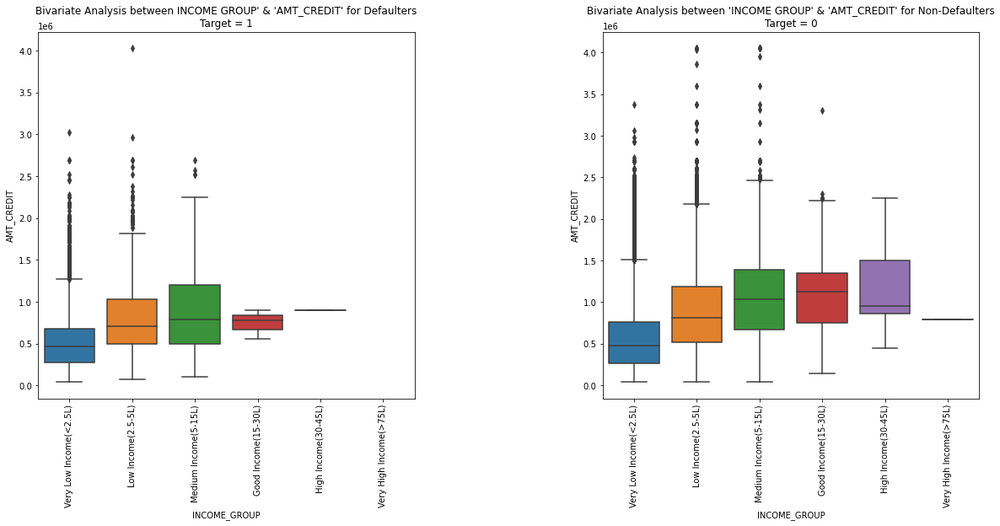

In [122]:
plt.figure(figsize = [20, 8])
plt.subplot(1,2,1)
plt.xticks(rotation=90)
plt.title("Bivariate Analysis between INCOME GROUP' & 'AMT_CREDIT' for Defaulters\nTarget = 1")
sns.boxplot(x = 'INCOME_GROUP', y = 'AMT_CREDIT', data = defaulter)

plt.subplots_adjust(wspace = 0.5)
plt.subplot(1,2,2)
plt.xticks(rotation=90)
plt.title("Bivariate Analysis between 'INCOME GROUP' & 'AMT_CREDIT' for Non-Defaulters\nTarget = 0")
sns.boxplot(x = 'INCOME_GROUP', y = 'AMT_CREDIT', data = non_defaulter)
plt.show()

### Target Variables : Amount Credit and Gender

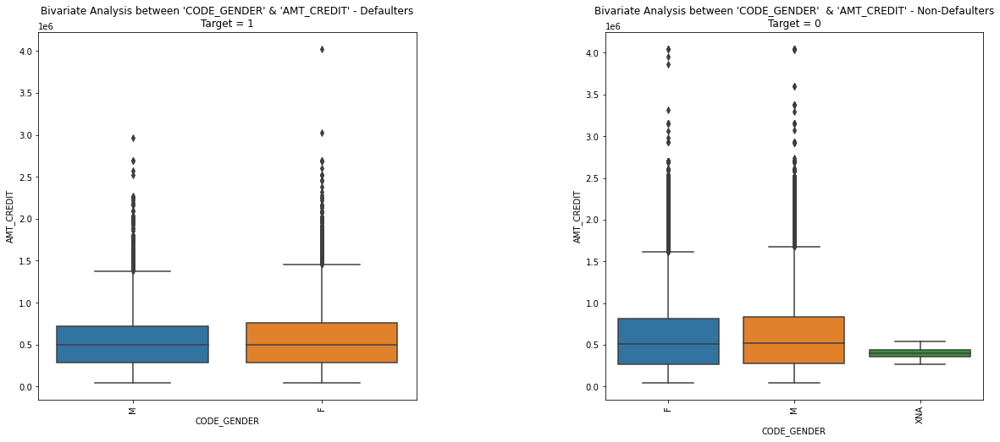

In [123]:
plt.figure(figsize = [20, 8])
plt.subplot(1,2,1)
plt.xticks(rotation=90)
plt.title("Bivariate Analysis between 'CODE_GENDER' & 'AMT_CREDIT' - Defaulters\nTarget = 1")
sns.boxplot(x = 'CODE_GENDER' , y = 'AMT_CREDIT' , data = defaulter)

plt.subplots_adjust(wspace = 0.5)
plt.subplot(1,2,2)
plt.xticks(rotation=90)
plt.title("Bivariate Analysis between 'CODE_GENDER'  & 'AMT_CREDIT' - Non-Defaulters\nTarget = 0")
sns.boxplot(x = 'CODE_GENDER' , y = 'AMT_CREDIT', data = non_defaulter)
plt.show()

### Target Variables : Target and Income Group

In [124]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=defaulter['INCOME_GROUP'],name='Defaulter',marker_color="red"))
fig.add_trace(go.Histogram(x=non_defaulter['INCOME_GROUP'],name='Non-Defaulter',marker_color="green"))
fig.update_layout(title="Bivariate Analysis between 'INCOME GROUP' & 'TARGET' for both Defaulters & Non-defalters",xaxis_title_text='INCOME_GROUP',yaxis_title_text='COUNT')
fig.show()

### Target Variables : Amount Credit and Gender

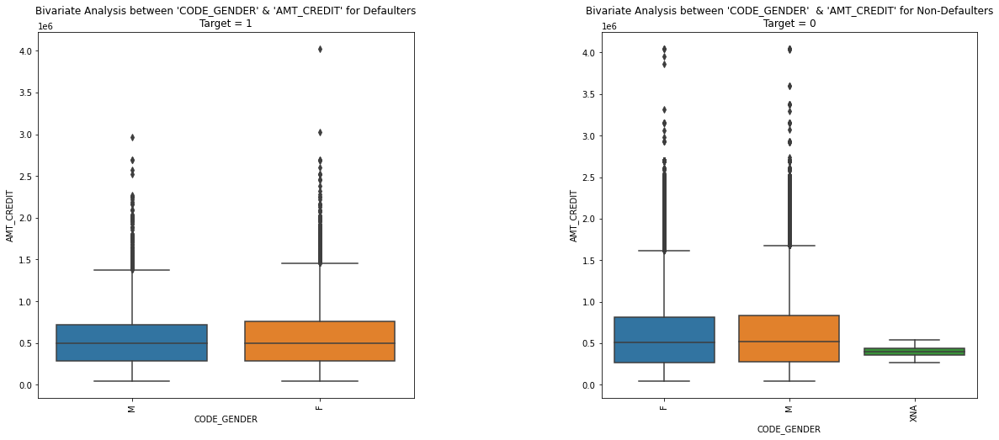

In [125]:
plt.figure(figsize = [20, 8])
plt.subplot(1,2,1)
plt.xticks(rotation=90)
plt.title("Bivariate Analysis between 'CODE_GENDER' & 'AMT_CREDIT' for Defaulters\nTarget = 1")
sns.boxplot(x = 'CODE_GENDER' , y = 'AMT_CREDIT' , data = defaulter)

plt.subplots_adjust(wspace = 0.5)
plt.subplot(1,2,2)
plt.xticks(rotation=90)
plt.title("Bivariate Analysis between 'CODE_GENDER'  & 'AMT_CREDIT' for Non-Defaulters\nTarget = 0")
sns.boxplot(x = 'CODE_GENDER' , y = 'AMT_CREDIT', data = non_defaulter)
plt.show()

## Multivariate Analysis

### Target Variables : Total Income, Education Type and Income Type

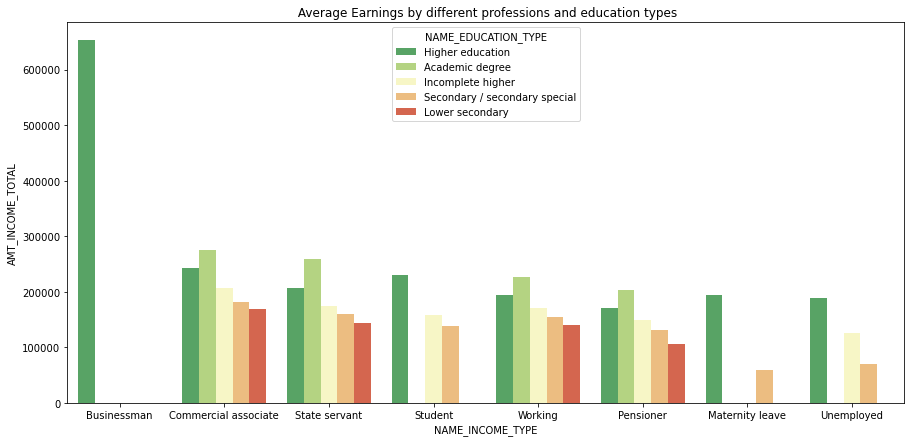

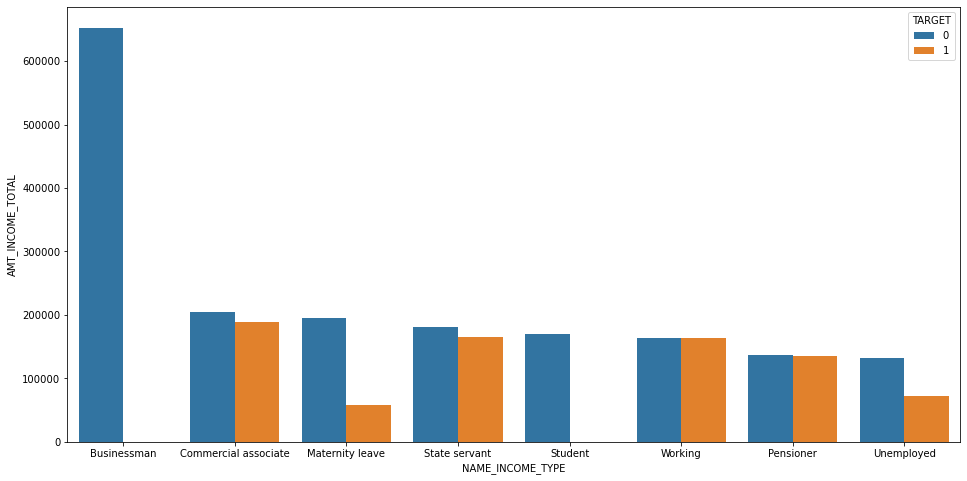

In [126]:
grouped_data = appdf.groupby(['NAME_EDUCATION_TYPE','NAME_INCOME_TYPE'])['AMT_INCOME_TOTAL'].mean().reset_index().sort_values(by='AMT_INCOME_TOTAL',ascending=False)
fig = plt.figure(figsize=(15,7))
sns.barplot('NAME_INCOME_TYPE','AMT_INCOME_TOTAL',data=grouped_data,hue='NAME_EDUCATION_TYPE',palette="RdYlGn_r")
plt.title(" Average Earnings by different professions and education types")
plt.show()

fig = plt.figure(figsize=(16,8))
target_data = appdf.groupby(['TARGET','NAME_INCOME_TYPE'])['AMT_INCOME_TOTAL'].mean().reset_index().sort_values(by='AMT_INCOME_TOTAL',ascending=False)
target_data.head()
sns.barplot('NAME_INCOME_TYPE','AMT_INCOME_TOTAL',hue='TARGET', data=target_data)
plt.show()

## Load Previous data set

In [127]:
# Read previous_application.csv
prev_df = pd.read_csv('previous_application.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
print(prev_df.shape)
total_prevrows = prev_df.shape[0]

(1670214, 37)


## Check the structure/metadata of the previous application data

In [128]:
print(prev_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

## Check for missing values and deal with them appropriately

### Plot the column data w.r.t to Percentage of null values

In [129]:
missing_prev_data = pd.DataFrame((prev_df.isnull().sum())*100/prev_df.shape[0]).reset_index()
missing_prev_data["type"] = "previous_application_data"
fig = px.line(missing_prev_data, x="index", y=0, color='type')
fig.update_layout(title='Percentage of Missing values in Previous Data',width=1000,
                   xaxis_title='Columns',
                   yaxis_title='Percentages')

### Drop the columns with more than 40% of null values

In [130]:
drop_col=(prev_df.isnull().sum())*100/prev_df.shape[0]
drop_col=drop_col[drop_col.values>=40.0]
print('\n===> List of columns with more than 40% missing values:\n\n',drop_col)
print('\n===> Total Number of columns with missing values more than 40%: ',len(drop_col))
print('\n===> Shape of Previous Application dataframe before dropping: ',prev_df.shape)


===> List of columns with more than 40% missing values:

 AMT_DOWN_PAYMENT             53.636480
RATE_DOWN_PAYMENT            53.636480
RATE_INTEREST_PRIMARY        99.643698
RATE_INTEREST_PRIVILEGED     99.643698
NAME_TYPE_SUITE              49.119754
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
dtype: float64

===> Total Number of columns with missing values more than 40%:  11

===> Shape of Previous Application dataframe before dropping:  (1670214, 37)


In [131]:
### Drop all columns with more than 40% missing values
prev_df.drop(labels=list(drop_col.index),axis=1,inplace=True)
### Check the shape of the dataframe after dropping
print('\n===> Shape of Previous Application dataframe after dropping: ',prev_df.shape)


===> Shape of Previous Application dataframe after dropping:  (1670214, 26)


### Check the remaining columns with <40% missing data and deal with them

In [132]:
less_than_40_cols = (prev_df.isnull().sum())
print(less_than_40_cols[less_than_40_cols > 0])

AMT_ANNUITY            372235
AMT_CREDIT                  1
AMT_GOODS_PRICE        385515
CNT_PAYMENT            372230
PRODUCT_COMBINATION       346
dtype: int64


### Seperating Categorical and Numerical data 

In [133]:
prev_numerical = list(prev_df.select_dtypes(include=["int64","float64"]).columns)
print('Previous Application Numerical Variables: \n\n', prev_numerical)
print('\nTotal Number of Numerical Variables in Previous application Data: ',len(prev_numerical))
print('\n\n')
prev_categorical = list(prev_df.select_dtypes(include="object").columns)
print('Previous Application Categorical Variables: \n\n', prev_categorical)
print('\nTotal Number of Categorical Variables in Previous application Data: ',len(prev_categorical))

Previous Application Numerical Variables: 

 ['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT']

Total Number of Numerical Variables in Previous application Data:  11



Previous Application Categorical Variables: 

 ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']

Total Number of Categorical Variables in Previous application Data:  15


In [134]:
## Lets replace NaN values with median as there are many outliers
prev_df['AMT_ANNUITY'] = prev_df['AMT_ANNUITY'].fillna(prev_df['AMT_ANNUITY'].median())
print("Nan Values After Replacement:", prev_df["AMT_ANNUITY"].isnull().sum())

Nan Values After Replacement: 0


In [135]:
## Lets replace NaN value with median as there are many outliers
prev_df['AMT_CREDIT'] = prev_df['AMT_CREDIT'].fillna(prev_df['AMT_CREDIT'].median())
print("Nan Values After Replacement:", prev_df["AMT_CREDIT"].isnull().sum())

Nan Values After Replacement: 0


In [136]:
## Lets replace NaN value with median as there are many outliers               
prev_df['AMT_GOODS_PRICE'] = prev_df['AMT_GOODS_PRICE'].fillna(prev_df['AMT_GOODS_PRICE'].median())
print("Nan Values After repleacement:", prev_df["AMT_GOODS_PRICE"].isnull().sum())

Nan Values After repleacement: 0


In [137]:
### Replace NaN with median
prev_df['CNT_PAYMENT'] = prev_df['CNT_PAYMENT'].fillna(prev_df['CNT_PAYMENT'].median())
print("Nan Values After replacement:", prev_df["CNT_PAYMENT"].isnull().sum())

Nan Values After replacement: 0


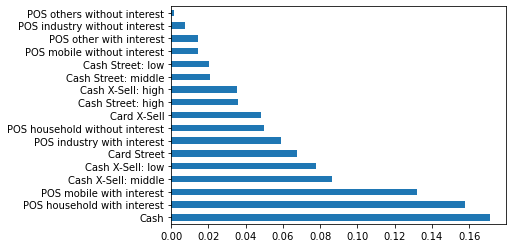

In [138]:
# There is 356 NaN values. Check for outliers
prev_df['PRODUCT_COMBINATION'].value_counts(normalize=True).plot.barh()
plt.show()

In [139]:
# Let's replace NaN with Cash as it is the top category
prev_df['PRODUCT_COMBINATION'] = prev_df['PRODUCT_COMBINATION'].fillna('Cash')
print("Nan Values After replacement:", prev_df["PRODUCT_COMBINATION"].isnull().sum())

Nan Values After replacement: 0


### Target Variable analysis

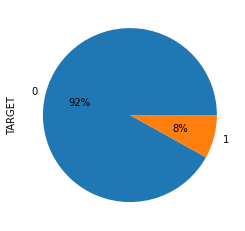

In [140]:
### Check for data imbalance on the target variable and normalize accordingly
### Here Target 0 is non-defaulter and Target 1 is defaulter.
appdf['TARGET'].value_counts().plot.pie(autopct="%1.0f%%")
plt.show()

In [141]:
## Check for NAME_CASH_LOAN_PURPOSE
prev_df['NAME_CASH_LOAN_PURPOSE'].value_counts(normalize = True).head()

XAP             0.552421
XNA             0.405887
Repairs         0.014229
Other           0.009345
Urgent needs    0.005036
Name: NAME_CASH_LOAN_PURPOSE, dtype: float64

In [142]:
## Check for DAYS_DECISION
print(prev_df['DAYS_DECISION'].value_counts().info())
print('\n')
print('Unique Records: ',prev_df['DAYS_DECISION'].nunique())

<class 'pandas.core.series.Series'>
Int64Index: 2922 entries, -245 to -1
Series name: DAYS_DECISION
Non-Null Count  Dtype
--------------  -----
2922 non-null   int64
dtypes: int64(1)
memory usage: 45.7 KB
None


Unique Records:  2922


In [143]:
## All Unique records are negative. Convert negative days into positive
prev_df['DAYS_DECISION'] = prev_df['DAYS_DECISION'].apply(lambda x: -x if x < 0 else x)
print(prev_df['DAYS_DECISION'].value_counts().info())

<class 'pandas.core.series.Series'>
Int64Index: 2922 entries, 245 to 1
Series name: DAYS_DECISION
Non-Null Count  Dtype
--------------  -----
2922 non-null   int64
dtypes: int64(1)
memory usage: 45.7 KB
None


In [144]:
## Check NAME_PAYMENT_TYPE
prev_df['NAME_PAYMENT_TYPE'].value_counts(normalize = True).mul(100).head()
## XNA accounts for ~38% of the data, leaving it as it is.

Cash through the bank                        61.881412
XNA                                          37.563091
Non-cash from your account                    0.490536
Cashless from the account of the employer     0.064962
Name: NAME_PAYMENT_TYPE, dtype: float64

In [145]:
## Check CODE_REJECT_REASON
prev_df['CODE_REJECT_REASON'].value_counts(normalize = True).mul(100)
## XAP accounts for ~81% of the data which doesn't provide any info on payment type, leaving it as it is.

XAP       81.013152
HC        10.491530
LIMIT      3.333705
SCO        2.243245
CLIENT     1.582791
SCOFR      0.767027
XNA        0.313972
VERIF      0.211650
SYSTEM     0.042929
Name: CODE_REJECT_REASON, dtype: float64

In [146]:
## Check NAME_CLIENT_TYPE
prev_df['NAME_CLIENT_TYPE'].value_counts(normalize = True).mul(100)

Repeater     73.718757
New          18.043376
Refreshed     8.121654
XNA           0.116213
Name: NAME_CLIENT_TYPE, dtype: float64

In [147]:
## Replace XNA with Repeater as it takes up major chunk of client type
prev_df['NAME_CLIENT_TYPE'] = prev_df['NAME_CLIENT_TYPE'].apply(lambda x: 'Repeater' if x == 'XNA' else x)
prev_df['NAME_CLIENT_TYPE'].value_counts(normalize = True).mul(100)

Repeater     73.834970
New          18.043376
Refreshed     8.121654
Name: NAME_CLIENT_TYPE, dtype: float64

## Merging Application and Previous application data sets

In [148]:
merge_data = appdf.merge(prev_df, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')
print("Shape of merge data frame: ", merge_data.shape)
print("Shape of Application data frame: ", appdf.shape)
print("Shape of Previous Application data frame: ", prev_df.shape)

Shape of merge data frame:  (1413701, 94)
Shape of Application data frame:  (307511, 69)
Shape of Previous Application data frame:  (1670214, 26)


## Check the structure of Merged data 

In [149]:
merge_data.info(verbose = True,null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 94 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   SK_ID_CURR                    1413701 non-null  int64   
 1   TARGET                        1413701 non-null  int64   
 2   NAME_CONTRACT_TYPE_x          1413701 non-null  object  
 3   CODE_GENDER                   1413701 non-null  object  
 4   FLAG_OWN_CAR                  1413701 non-null  object  
 5   FLAG_OWN_REALTY               1413701 non-null  object  
 6   CNT_CHILDREN                  1413701 non-null  int64   
 7   AMT_INCOME_TOTAL              1413701 non-null  float64 
 8   AMT_CREDIT_x                  1413701 non-null  float64 
 9   AMT_ANNUITY_x                 1413701 non-null  float64 
 10  AMT_GOODS_PRICE_x             1413701 non-null  float64 
 11  NAME_TYPE_SUITE               1413701 non-null  object  
 12  NAME_INCOME_TY

### Segregate merged data into Cateogrical and Numerical

In [150]:
merge_numerical = list(merge_data.select_dtypes(include=["int64","float64"]).columns)
print('Merged Data Numerical Variables: \n\n', merge_numerical)
print('\nTotal Number of Numerical Variables in Merged application Data: ',len(merge_numerical))
print('\n\n')
merge_categorical = list(merge_data.select_dtypes(include="object").columns)
print('Merged Data Categorical Variables: \n\n', merge_categorical)
print('\nTotal Number of Categorical Variables in Merged application Data: ',len(merge_categorical))

Merged Data Numerical Variables: 

 ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'REGION_POPULATION_RELATIVE', 'YEARS_BIRTH', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START_x', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'YEARS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMEN

## Univariate Analysis

### Categorical Data

### Target Variable : Name Contract Status

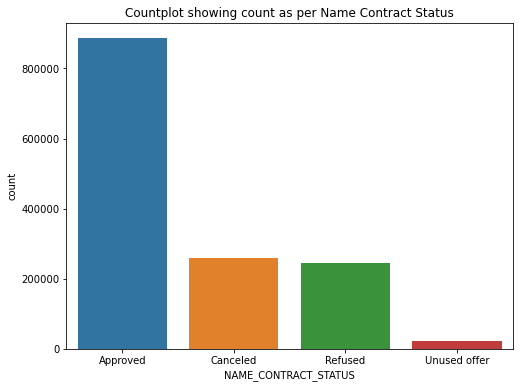

In [151]:
plt.figure(figsize = [8,6])
plt.title("Countplot showing count as per Name Contract Status")
sns.countplot(merge_data.NAME_CONTRACT_STATUS)
plt.show()

### Target Variable : Name Client Type

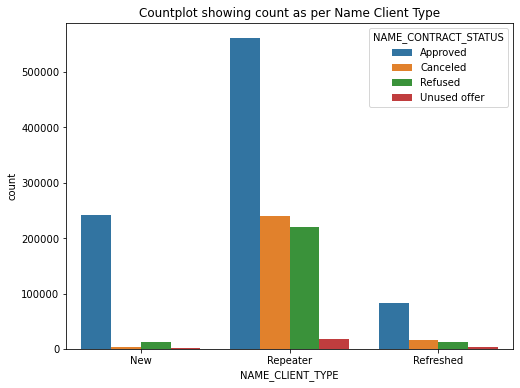

In [152]:
plt.figure(figsize = [8,6])
plt.title("Countplot showing count as per Name Client Type")
sns.countplot(merge_data.NAME_CLIENT_TYPE, hue=merge_data.NAME_CONTRACT_STATUS)
plt.show()

### Target Variable : Channel Type

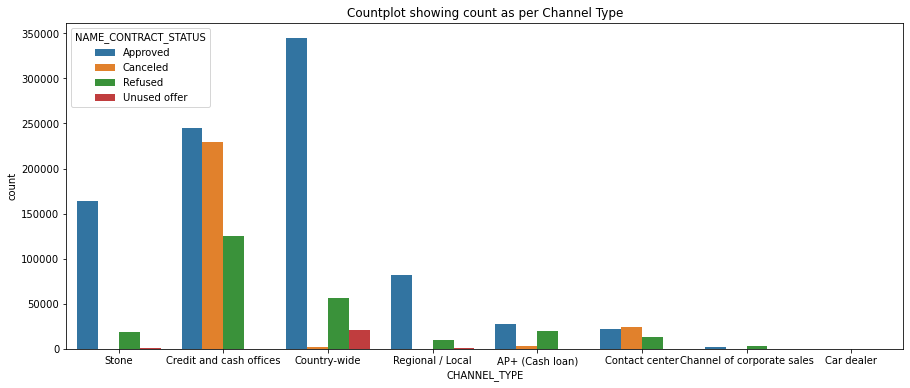

In [153]:
plt.figure(figsize = [15,6])
plt.title("Countplot showing count as per Channel Type")
sns.countplot(merge_data.CHANNEL_TYPE, hue=merge_data.NAME_CONTRACT_STATUS)
plt.show()

### Target Variable : Name Yield Group

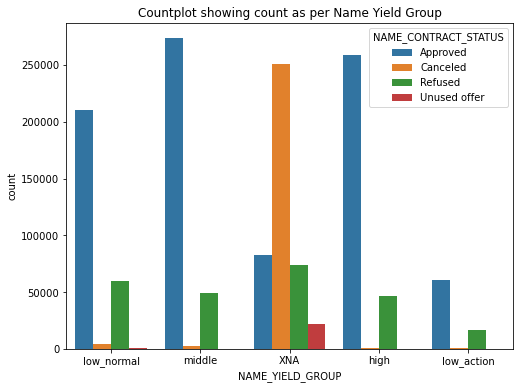

In [154]:
plt.figure(figsize = [8,6])
plt.title("Countplot showing count as per Name Yield Group")
sns.countplot(merge_data.NAME_YIELD_GROUP, hue=merge_data.NAME_CONTRACT_STATUS)
plt.show()

### Target Variable : Goods Category

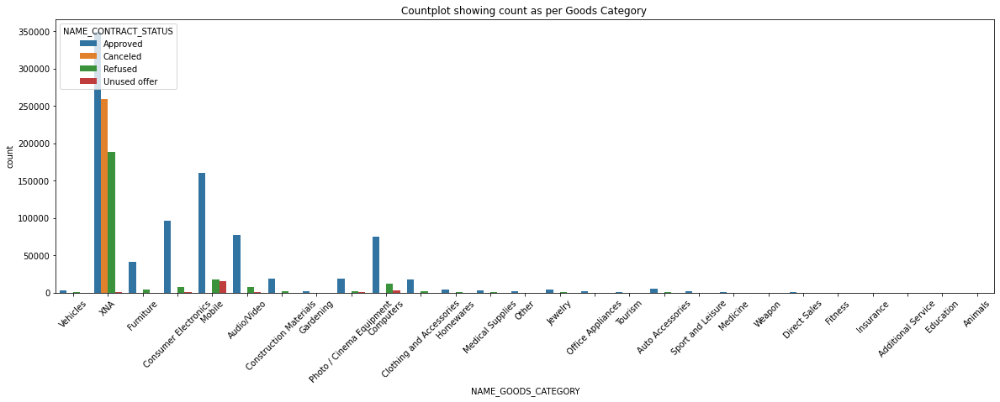

In [155]:
plt.figure(figsize = [20,6])
plt.title("Countplot showing count as per Goods Category ")
sns.countplot(merge_data.NAME_GOODS_CATEGORY, hue=merge_data.NAME_CONTRACT_STATUS)
plt.xticks(rotation=45)
plt.show()